In [1]:
import pandas as pd
import sys
import os
from transformers import pipeline, AutoTokenizer, AutoModelForQuestionAnswering
import time
import random
from tqdm import tqdm
import json
import evaluate

/home/phaxssi/miniconda3/envs/nlp-tasks/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
# sys.path.append(os.path.abspath(os.path.join('..', 'tornado-tasks')))
import functions as fn

/home/phaxssi/miniconda3/envs/nlp-tasks/lib/python3.12/site-packages/huggingface_hub/file_download.py:1132: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


In [3]:
path = 'results/bert-multi-cased-finetuned-xquadv1.xlsx'

In [5]:
model_name = path.split('/')[1].split('.')[0]
for data_chunk in fn.read_excel_in_chunks(path, fn.cols_to_use, chunk_size=1000):
    with open(f'text/{model_name}.txt', 'a') as file:
        for part in fn.format_results(data_chunk):
            file.write(part + '\n')

In [6]:
import evaluate
from transformers import AutoTokenizer, AutoModelForQuestionAnswering, pipeline

# Cargar el modelo y el tokenizer
model_name = "mrm8488/bert-multi-cased-finetuned-xquadv1"
tokenizer = AutoTokenizer.from_pretrained(model_name)
model = AutoModelForQuestionAnswering.from_pretrained(model_name)

# Crear el pipeline de pregunta y respuesta
qa_pipeline = pipeline("question-answering", model=model, tokenizer=tokenizer)

# Definir un pequeño dataset para testeo
dataset = [
    {"context": "Hugging Face Inc. is a company based in New York City. Its headquarters are in DUMBO, therefore very close to the Manhattan Bridge.",
     "question": "Where is Hugging Face Inc. based?", "answer": "New York City"},
    {"context": "Hugging Face Inc. is a company based in New York City. Its headquarters are in DUMBO, therefore very close to the Manhattan Bridge.",
     "question": "Where are the headquarters of Hugging Face Inc.?", "answer": "DUMBO"}
]

# Evaluar las respuestas del modelo
predictions = []
references = []

for item in dataset:
    result = qa_pipeline(question=item["question"], context=item["context"])
    predictions.append(result['answer'])
    references.append(item["answer"])

# Calcular la métrica de accuracy
accuracy_metric = evaluate.load("accuracy")

# Convertir las respuestas en listas binarias (0 para incorrecto, 1 para correcto)
binary_predictions = [1 if pred.lower() == ref.lower() else 0 for pred, ref in zip(predictions, references)]
binary_references = [1] * len(references)

# Calcular accuracy
results = accuracy_metric.compute(references=binary_references, predictions=binary_predictions)

Some weights of the model checkpoint at mrm8488/bert-multi-cased-finetuned-xquadv1 were not used when initializing BertForQuestionAnswering: ['bert.pooler.dense.bias', 'bert.pooler.dense.weight']
- This IS expected if you are initializing BertForQuestionAnswering from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertForQuestionAnswering from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


['xlm-roberta-large-squad2', 'bert-multi-cased-finedtuned-xquad-tydiqa-goldp', 'distilbert-base-cased-distilled-squad', 'electra-base-squad2']


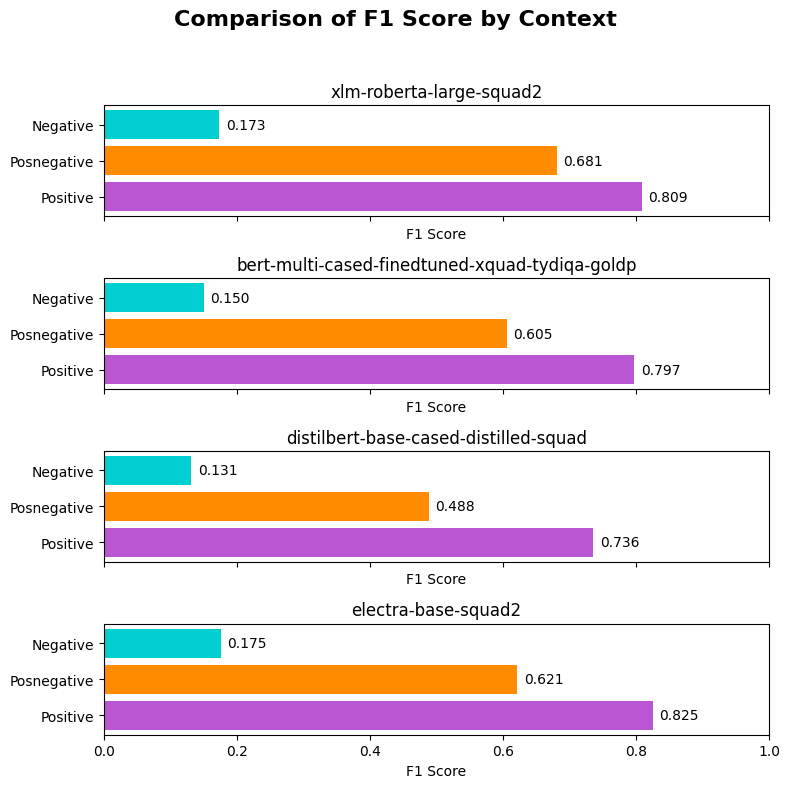

In [9]:
import pandas as pd
import matplotlib.pyplot as plt

file_path = 'metrics/combined_results.xlsx'  # Reemplaza con la ruta a tu archivo
sheets = ['Model 2', 'Model 4', 'Model 5', 'Model 6']  # Nombres de las hojas en tu archivo de Excel

# Leer datos de las hojas del archivo de Excel
data_frames = [pd.read_excel(file_path, sheet_name=sheet) for sheet in sheets]

# Filtrar datos por la métrica F1 y reorganizar las columnas
f1_scores = [df[df['Metric'] == 'F1'][['Positive', 'Posnegative', 'Negative']] for df in data_frames]

# Extraer los nombres de los modelos
model_names = [df['Input File'].iloc[0] for df in data_frames]
model_names = [name.split('.')[0] for name in model_names]

# Configuración de colores
colors = ['mediumorchid', 'darkorange', 'darkturquoise']

# Crear figura y ejes
fig, axes = plt.subplots(nrows=len(sheets), ncols=1, figsize=(8, 8), sharex=True)

# Graficar cada modelo en un subgráfico separado
for ax, model_name, data in zip(axes, model_names, f1_scores):
    bars = ax.barh(data.columns, data.iloc[0], color=colors)
    ax.set_title(model_name)
    ax.set_xlabel('F1 Score')
    ax.set_xlim(0, 1)  # Ajustar el rango del eje X

    # Agregar las etiquetas de valores en las barras
    for bar in bars:
        width = bar.get_width()
        label_x_pos = width + 0.01  # ajustar para que el texto no esté demasiado pegado a la barra
        ax.text(label_x_pos, bar.get_y() + bar.get_height() / 2, f'{width:.3f}', va='center')

# Añadir título general a la figura
fig.suptitle('Comparison of F1 Score by Context', fontsize=16, fontweight='bold')

# Ajustar el layout para evitar superposiciones
plt.tight_layout(rect=[0, 0, 1, 0.95])

# Mostrar el gráfico
plt.show()
# Guardar el gráfico
fig.savefig('model_f1_score_comparison.png')

In [8]:
binary_predictions

[1, 1]

In [4]:
f1_metric = evaluate.load("f1")
print(f1_metric)

EvaluationModule(name: "f1", module_type: "metric", features: {'predictions': Value(dtype='int32', id=None), 'references': Value(dtype='int32', id=None)}, usage: """
Args:
    predictions (`list` of `int`): Predicted labels.
    references (`list` of `int`): Ground truth labels.
    labels (`list` of `int`): The set of labels to include when `average` is not set to `'binary'`, and the order of the labels if `average` is `None`. Labels present in the data can be excluded, for example to calculate a multiclass average ignoring a majority negative class. Labels not present in the data will result in 0 components in a macro average. For multilabel targets, labels are column indices. By default, all labels in `predictions` and `references` are used in sorted order. Defaults to None.
    pos_label (`int`): The class to be considered the positive class, in the case where `average` is set to `binary`. Defaults to 1.
    average (`string`): This parameter is required for multiclass/multilabel t

In [12]:
exact_match_metric = evaluate.load("exact_match")
answer='January 2 2022'
predicted =' January 2, 2022,'
predicted_strip = predicted.strip()
result_predicted = exact_match_metric.compute(references=[answer], predictions=[predicted], ignore_case=True, ignore_punctuation=True, ignore_numbers=True)
result_predicted_strip = exact_match_metric.compute(references=[answer], predictions=[predicted_strip], ignore_case=True, ignore_punctuation=True, ignore_numbers=True)
print(result_predicted)
print(result_predicted_strip)

{'exact_match': 0.0}
{'exact_match': 1.0}


In [15]:
rouge = evaluate.load("rouge")
answer='January 2 2022'
predicted =' January 2, 2022,'
predicted_strip = predicted.strip()
result_predicted = rouge.compute(references=[answer], predictions=[predicted], use_stemmer=True)
result_predicted_strip = rouge.compute(references=[answer], predictions=[predicted_strip], use_stemmer=True)
print(result_predicted)
print(result_predicted_strip)

{'rouge1': 1.0, 'rouge2': 1.0, 'rougeL': 1.0, 'rougeLsum': 1.0}
{'rouge1': 1.0, 'rouge2': 1.0, 'rougeL': 1.0, 'rougeLsum': 1.0}


In [20]:
bleu = evaluate.load("bleu")
answer=['January 2 2022']
predicted =[' January 2, 2022,']
# predicted_strip = predicted.strip()
result_predicted = bleu.compute(references=[answer], predictions=[predicted], use_stemmer=True)
# result_predicted_strip = bleu.compute(references=[answer], predictions=[predicted_strip], use_stemmer=True)
print(result_predicted)
# print(result_predicted_strip)

ValueError: Predictions and/or references don't match the expected format.
Expected format:
Feature option 0: {'predictions': Value(dtype='string', id='sequence'), 'references': Sequence(feature=Value(dtype='string', id='sequence'), length=-1, id='references')}
Feature option 1: {'predictions': Value(dtype='string', id='sequence'), 'references': Value(dtype='string', id='sequence')},
Input predictions: [' January 2, 2022,'],
Input references: ['January 2 2022']

In [21]:
from evaluate import load

bleu = load("bleu")

# Definimos las respuestas correctas y predichas
answer = ['January 2 2022']
predicted = [' January 2, 2022,']

# Eliminamos los espacios adicionales alrededor de las cadenas
answer = [ans.strip() for ans in answer]
predicted = [pred.strip() for pred in predicted]

# Calculamos el BLEU score
result_predicted = bleu.compute(references=[answer], predictions=predicted, use_stemmer=True)
print(result_predicted)

TypeError: Bleu._compute() got an unexpected keyword argument 'use_stemmer'

In [33]:
predictions = ["hello there general kenobi"]
references = [
    ["hello there general kenobi"]
]
bleu = evaluate.load("bleu")
results = bleu.compute(predictions=predictions, references=references)
print(results)

{'bleu': 1.0, 'precisions': [1.0, 1.0, 1.0, 1.0], 'brevity_penalty': 1.0, 'length_ratio': 1.0, 'translation_length': 4, 'reference_length': 4}


In [14]:
predicted_strip.strip()

'January 2, 2022,'

In [2]:
import pandas as pd

# Ejemplo de DataFrame
data = {
    'prediction': ['respuesta 1', 'respuesta 2', 'respuesta 3'],
    'ground_truth': ['respuesta 1 correcta', 'respuesta 2 correcta', 'respuesta 3 correcta']
}
df = pd.DataFrame(data)

# Función de normalización (tal como se definió antes)
def normalize_answer(s):
    """Lower text and remove punctuation, articles and extra whitespace."""
    import re
    import string

    def remove_articles(text):
        return re.sub(r"\b(a|an|the)\b", " ", text)

    def white_space_fix(text):
        return " ".join(text.split())

    def remove_punc(text):
        exclude = set(string.punctuation)
        return "".join(ch for ch in text if ch not in exclude)

    def lower(text):
        return text.lower()

    return white_space_fix(remove_articles(remove_punc(lower(s))))

# Función para calcular el F1 score
def f1_score(prediction, ground_truth):
    from collections import Counter

    prediction_tokens = normalize_answer(prediction)
    ground_truth_tokens = normalize_answer(ground_truth)
    common = Counter(prediction_tokens) & Counter(ground_truth_tokens)
    num_same = sum(common.values())
    if num_same == 0:
        return 0
    precision = 1.0 * num_same / len(prediction_tokens)
    recall = 1.0 * num_same / len(ground_truth_tokens)
    f1 = (2 * precision * recall) / (precision + recall)
    return f1

# Calculando el F1 score para cada fila del DataFrame
df['f1_score'] = df.apply(lambda row: f1_score(row['prediction'], row['ground_truth']), axis=1)

# Mostrando el DataFrame con los resultados
print(df)

    prediction          ground_truth  f1_score
0  respuesta 1  respuesta 1 correcta  0.709677
1  respuesta 2  respuesta 2 correcta  0.709677
2  respuesta 3  respuesta 3 correcta  0.709677


In [45]:
import pandas as pd
from collections import Counter

# Ejemplo de DataFrame con múltiples respuestas correctas
data = {
    'prediction': ['January 2, 2022', 'medical procedural', '|', 'defensive coordinator'],
    'ground_truth': [['January 2 2022', 'Jan 2, 2022', 'Jan. 2, 2022', 'January 2, 2022', '2 January 2022', '2 Jan, 2022', '2 Jan., 2022', '2 January, 2022'], 
                     ['medical'], 
                     ['Kentucky Wildcats'], 
                     ['defensive coordinator']]
}
df = pd.DataFrame(data)

# Función de normalización
def normalize_answer(s):
    """Lower text and remove punctuation, articles and extra whitespace."""
    import re
    import string

    def remove_articles(text):
        return re.sub(r"\b(a|an|the)\b", " ", text)

    def white_space_fix(text):
        return " ".join(text.split())

    def remove_punc(text):
        exclude = set(string.punctuation)
        return "".join(ch for ch in text if ch not in exclude)

    def lower(text):
        return text.lower()

    return white_space_fix(remove_articles(remove_punc(lower(s))))

# Función para calcular el F1 score entre una predicción y una respuesta correcta
def f1_score(prediction, ground_truth):
    prediction_tokens = normalize_answer(prediction).split()
    ground_truth_tokens = normalize_answer(ground_truth).split()
    common = Counter(prediction_tokens) & Counter(ground_truth_tokens)
    num_same = sum(common.values())
    if num_same == 0:
        return 0.0
    precision = 1.0 * num_same / len(prediction_tokens)
    recall = 1.0 * num_same / len(ground_truth_tokens)
    f1 = (2 * precision * recall) / (precision + recall)
    return f1


# Función para calcular el F1 score máximo comparando la predicción con múltiples respuestas correctas
def max_f1_score(prediction, ground_truths):
    return max(f1_score(prediction, gt) for gt in ground_truths)

# Calculando el F1 score máximo para cada fila del DataFrame
df['f1_score_max'] = df.apply(lambda row: max_f1_score(row['prediction'], row['ground_truth']), axis=1)


# # Función para calcular el F1 score máximo comparando la predicción con múltiples respuestas correctas
# def max_f1_score(prediction, ground_truths):
#     return max(f1_score(prediction, gt) for gt in ground_truths)

# # Calculando el F1 score para cada fila del DataFrame
# df['f1_score_max'] = df.apply(lambda row: max_f1_score(row['prediction'], row['ground_truth']), axis=1)
# df['f1_score_score'] = df.apply(lambda row: f1_score(row['prediction'], row['ground_truth']), axis=1)

# Mostrando el DataFrame con los resultados
df

,prediction,ground_truth,f1_score_max
0,"January 2, 2022","[January 2 2022, Jan 2, 2022, Jan. 2, 2022, Ja...",1.000000
1,medical procedural,[medical],0.666667
2,|,[Kentucky Wildcats],0.000000
3,defensive coordinator,[defensive coordinator],1.000000


In [36]:
f1_scores_positive = []

for index, row in df.iterrows():
    f1_score_max = row['f1_score_max']
    f1_scores_positive.append(f1_score_max)

avg_f1_positive = sum(f1_scores_positive) / len(f1_scores_positive) if f1_scores_positive else 0

In [37]:
avg_f1_positive

0.16666666666666666

In [41]:
import pandas as pd
from collections import Counter
import re
import string

# Ejemplo de DataFrame con múltiples respuestas correctas
data = {
    'prediction': ['January 2, 2022', 'medical procedural', '|', 'defensive coordinator'],
    'ground_truth': [['January 2 2022', 'Jan 2, 2022', 'Jan. 2, 2022', 'January 2, 2022', '2 January 2022', '2 Jan, 2022', '2 Jan., 2022', '2 January, 2022'], 
                     ['medical'], 
                     ['Kentucky Wildcats'], 
                     ['defensive coordinator']]
}
df = pd.DataFrame(data)

# Función de normalización
def normalize_answer(s):
    """Lower text and remove punctuation, articles and extra whitespace."""
    def remove_articles(text):
        return re.sub(r"\b(a|an|the)\b", " ", text)

    def white_space_fix(text):
        return " ".join(text.split())

    def remove_punc(text):
        exclude = set(string.punctuation)
        return "".join(ch for ch in text if ch not in exclude)

    def lower(text):
        return text.lower()

    return white_space_fix(remove_articles(remove_punc(lower(s))))

# Función para calcular el F1 score entre una predicción y una respuesta correcta
def f1_score(prediction, ground_truth):
    prediction_tokens = normalize_answer(prediction).split()
    ground_truth_tokens = normalize_answer(ground_truth).split()
    common = Counter(prediction_tokens) & Counter(ground_truth_tokens)
    num_same = sum(common.values())
    if num_same == 0:
        return 0.0
    precision = 1.0 * num_same / len(prediction_tokens)
    recall = 1.0 * num_same / len(ground_truth_tokens)
    f1 = (2 * precision * recall) / (precision + recall)
    return f1

# Función para calcular el F1 score máximo comparando la predicción con múltiples respuestas correctas
def max_f1_score(prediction, ground_truths):
    return max(f1_score(prediction, gt) for gt in ground_truths)

# Calculando el F1 score máximo para cada fila del DataFrame
df['f1_score_max'] = df.apply(lambda row: max_f1_score(row['prediction'], row['ground_truth']), axis=1)

# Calculando el promedio del F1 score
average_f1_score = df['f1_score_max'].mean()

# Mostrando el DataFrame con los resultados y el promedio del F1 score
df

,prediction,ground_truth,f1_score_max
0,"January 2, 2022","[January 2 2022, Jan 2, 2022, Jan. 2, 2022, Ja...",1.000000
1,medical procedural,[medical],0.666667
2,|,[Kentucky Wildcats],0.000000
3,defensive coordinator,[defensive coordinator],1.000000


In [3]:
import ast

data = pd.read_excel('electra-base-squad2.xlsx')
df = data.head(50)
df = df[['Positive Predicted Answer', 'Correct Answer', 'EM Positive']]
df['Correct Answer'] = df['Correct Answer'].apply(ast.literal_eval)
df

,Positive Predicted Answer,Correct Answer,EM Positive
0,"January 2, 2022","[January 2 2022, Jan 2, 2022, Jan. 2, 2022, Ja...",1
1,medical procedural,[medical],0
2,|,[Kentucky Wildcats],0
3,defensive coordinator,[defensive coordinator],1
4,"936,172","[936,172, 936172]",1
5,EVO Entertainment Group,[EVO Entertainment Group],1
6,"SoFi Stadium in Inglewood, California",[SoFi Stadium],0
7,"February 21, 2022","[February 21, Feb 21, Feb. 21, 21 February, 21...",0
8,Mahershala Ali,[The Power of the Dog],0
9,$100,[$100 per seat],0


In [4]:
threshold = 0.8
input_path = 'electra-base-squad2.xlsx'
output_file = 'metrics_electra-base-squad2.xlsx'

# Inicializar el diccionario para almacenar los resultados
all_results = {}

# Procesar el archivo de entrada
result_df = fn.compute_metrics(input_path, threshold)
sheet_name = 'Model 1'
result_df.insert(0, 'Input File', os.path.basename(input_path))
result_df.insert(1, 'Model Number', 1)
all_results[sheet_name] = result_df

# Guardar los resultados en un archivo Excel
with pd.ExcelWriter(output_file) as writer:
    for sheet_name, result_df in all_results.items():
        result_df.to_excel(writer, sheet_name=sheet_name, index=False)

In [77]:
import pandas as pd
from collections import Counter
import re
import string

# Ejemplo de DataFrame con múltiples respuestas correctas
# data = {
#     'Positive Predicted Answer': ['January 2, 2022', 'medical procedural', '|', 'defensive coordinator'],
#     'Correct Answer': [['January 2 2022', 'Jan 2, 2022', 'Jan. 2, 2022', 'January 2, 2022', '2 January 2022', '2 Jan, 2022', '2 Jan., 2022', '2 January, 2022'], 
#                      ['medical'], 
#                      ['Kentucky Wildcats'], 
#                      ['defensive coordinator']]
# }
# df = pd.DataFrame(data)

# Función de normalización
def normalize_answer(s):
    """Lower text and remove punctuation, articles and extra whitespace."""
    def remove_articles(text):
        return re.sub(r"\b(a|an|the)\b", " ", text)

    def white_space_fix(text):
        return " ".join(text.split())

    def remove_punc(text):
        exclude = set(string.punctuation)
        return "".join(ch for ch in text if ch not in exclude)

    def lower(text):
        return text.lower()

    return white_space_fix(remove_articles(remove_punc(lower(s))))

# Función para calcular el F1 score entre una predicción y una respuesta correcta
def f1_score(prediction, ground_truth):
    print(f'Prediction: {prediction}')
    print('--------------')
    prediction_tokens = normalize_answer(prediction).split()
    ground_truth_tokens = normalize_answer(ground_truth).split()
    common = Counter(prediction_tokens) & Counter(ground_truth_tokens)
    num_same = sum(common.values())
    if num_same == 0:
        return 0.0
    precision = 1.0 * num_same / len(prediction_tokens)
    recall = 1.0 * num_same / len(ground_truth_tokens)
    f1 = (2 * precision * recall) / (precision + recall)
    return f1

# Función para calcular el F1 score máximo comparando la predicción con múltiples respuestas correctas
def max_f1_score(prediction, ground_truths):
    print(f'Ground Truths: {ground_truths}')
    max_f1 = 0.0
    for gt in ground_truths:
        print(f'Ground Truth: {gt}')
        f1 = f1_score(prediction, gt)
        if f1 > max_f1:
            max_f1 = f1
    return max_f1

df['Correct Answer'] = df['Correct Answer'].apply(lambda x: x if isinstance(x, list) else [x])

# Calculando el F1 score máximo para cada fila del DataFrame
df['f1_score_max'] = df.apply(lambda row: max_f1_score(row['Positive Predicted Answer'], row['Correct Answer']), axis=1)
# df['f1_score'] = df.apply(lambda row: f1_score(row['Positive Predicted Answer'], row['Correct Answer']), axis=1)

# Calculando el promedio del F1 score
average_f1_score = df['f1_score_max'].mean()

# Mostrando el DataFrame con los resultados y el promedio del F1 score
# df

Ground Truths: ['January 2 2022', 'Jan 2, 2022', 'Jan. 2, 2022', 'January 2, 2022', '2 January 2022', '2 Jan, 2022', '2 Jan., 2022', '2 January, 2022']
Ground Truth: January 2 2022
Prediction: January 2, 2022
--------------
Ground Truth: Jan 2, 2022
Prediction: January 2, 2022
--------------
Ground Truth: Jan. 2, 2022
Prediction: January 2, 2022
--------------
Ground Truth: January 2, 2022
Prediction: January 2, 2022
--------------
Ground Truth: 2 January 2022
Prediction: January 2, 2022
--------------
Ground Truth: 2 Jan, 2022
Prediction: January 2, 2022
--------------
Ground Truth: 2 Jan., 2022
Prediction: January 2, 2022
--------------
Ground Truth: 2 January, 2022
Prediction: January 2, 2022
--------------
Ground Truths: ['medical']
Ground Truth: medical
Prediction: medical procedural
--------------
Ground Truths: ['Kentucky Wildcats']
Ground Truth: Kentucky Wildcats
Prediction: |
--------------
Ground Truths: ['defensive coordinator']
Ground Truth: defensive coordinator
Prediction

In [79]:
df

,Positive Predicted Answer,Correct Answer,EM Positive,f1_score_max
0,"January 2, 2022","[January 2 2022, Jan 2, 2022, Jan. 2, 2022, Ja...",1,1.000000
1,medical procedural,[medical],0,0.666667
2,|,[Kentucky Wildcats],0,0.000000
3,defensive coordinator,[defensive coordinator],1,1.000000
4,"936,172","[936,172, 936172]",1,1.000000
5,EVO Entertainment Group,[EVO Entertainment Group],1,1.000000
6,"SoFi Stadium in Inglewood, California",[SoFi Stadium],0,0.571429
7,"February 21, 2022","[February 21, Feb 21, Feb. 21, 21 February, 21...",0,0.800000
8,Mahershala Ali,[The Power of the Dog],0,0.000000
9,$100,[$100 per seat],0,0.500000


In [78]:
average_f1_score

0.7200836940836942

In [26]:
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
import string

def normalize_answer1(text):
    """Tokenizar y normalizar la respuesta eliminando puntuación no esencial, stop words y llevándola a minúsculas."""
    words = word_tokenize(text.lower())
    words = [word for word in words if word not in string.punctuation]
    stop_words = set(stopwords.words('english'))
    words = [word for word in words if word not in stop_words]
    return words

stop_words = set(stopwords.words('english'))

def normalize_answer2(s):
    """Lower text and remove punctuation, stop_words and extra whitespace."""
    import re
    import string

    def remove_stop_words(text):
        return " ".join([word for word in text.split() if word.lower() not in stop_words])

    def white_space_fix(text):
        return " ".join(text.split())

    def remove_punc(text):
        exclude = set(string.punctuation)
        return "".join(ch for ch in text if ch not in exclude)

    def lower(text):
        return text.lower()

    return white_space_fix(remove_stop_words(remove_punc(lower(s)))).split

def normalize_answer(text):
    """Lower text and remove punctuation, stop_words and extra whitespace."""

    text_without_stop_words = " ".join([word for word in text.split() if word.lower() not in stop_words])
    text_white_space_fix = " ".join(text_without_stop_words.split())
    text_without_punctuation = "".join(ch for ch in text_white_space_fix if ch not in string.punctuation)
    text_lower = text_without_punctuation.lower()
    return text_lower.split()

import os

def compute_metrics(input_file, output_file, threshold):
    
    df = pd.read_excel(input_file)
    
    f1_scores_positive = []
    f1_scores_negative = []
    f1_scores_posneg = []

    em_scores_positive = df['EM Positive'].tolist()
    em_scores_negative = df['EM Negative'].tolist()
    em_scores_posneg = df['EM PosNeg'].tolist()
    
    em_cosine_positive = df['Cosine Positive'].apply(lambda x: 1 if x >= threshold else 0).tolist()
    em_cosine_negative = df['Cosine Negative'].apply(lambda x: 1 if x >= threshold else 0).tolist()
    em_cosine_posneg = df['Cosine PosNeg'].apply(lambda x: 1 if x >= threshold else 0).tolist()
    
    em_jaccard_positive = df['Jaccard Positive'].apply(lambda x: 1 if x >= threshold else 0).tolist()
    em_jaccard_negative = df['Jaccard Negative'].apply(lambda x: 1 if x >= threshold else 0).tolist()
    em_jaccard_posneg = df['Jaccard PosNeg'].apply(lambda x: 1 if x >= threshold else 0).tolist()

    for index, row in df.iterrows():
        correct_answer = row['Correct Answer']
        
        f1_positive = f1_score(row['Positive Predicted Answer'], correct_answer)
        f1_scores_positive.append(f1_positive)
        
        f1_negative = f1_score(row['Negative Predicted Answer'], correct_answer)
        f1_scores_negative.append(f1_negative)
        
        f1_posneg = f1_score(row['PosNeg Predicted Answer'], correct_answer)
        f1_scores_posneg.append(f1_posneg)
    
    avg_f1_positive = sum(f1_scores_positive) / len(f1_scores_positive) if f1_scores_positive else 0
    avg_f1_negative = sum(f1_scores_negative) / len(f1_scores_negative) if f1_scores_negative else 0
    avg_f1_posneg = sum(f1_scores_posneg) / len(f1_scores_posneg) if f1_scores_posneg else 0
    
    avg_em_positive = sum(em_scores_positive) / len(em_scores_positive) if em_scores_positive else 0
    avg_em_negative = sum(em_scores_negative) / len(em_scores_negative) if em_scores_negative else 0
    avg_em_posneg = sum(em_scores_posneg) / len(em_scores_posneg) if em_scores_posneg else 0
    
    avg_em_cosine_positive = sum(em_cosine_positive) / len(em_cosine_positive) if em_cosine_positive else 0
    avg_em_cosine_negative = sum(em_cosine_negative) / len(em_cosine_negative) if em_cosine_negative else 0
    avg_em_cosine_posneg = sum(em_cosine_posneg) / len(em_cosine_posneg) if em_cosine_posneg else 0
    
    avg_em_jaccard_positive = sum(em_jaccard_positive) / len(em_jaccard_positive) if em_jaccard_positive else 0
    avg_em_jaccard_negative = sum(em_jaccard_negative) / len(em_jaccard_negative) if em_jaccard_negative else 0
    avg_em_jaccard_posneg = sum(em_jaccard_posneg) / len(em_jaccard_posneg) if em_jaccard_posneg else 0
    
    result_data = {
        'Metric': [
            'F1', 
            'EM - String',
            f'EM - Cosine (threshold = {threshold})',
            f'EM - Jaccard (threshold = {threshold})'
        ],
        'Positive': [
            avg_f1_positive, avg_em_positive,
            avg_em_cosine_positive, avg_em_jaccard_positive
        ],
        'Negative': [
            avg_f1_negative, avg_em_negative,
            avg_em_cosine_negative, avg_em_jaccard_negative
        ],
        'Posnegative': [
            avg_f1_posneg, avg_em_posneg,
            avg_em_cosine_posneg, avg_em_jaccard_posneg
        ]
    }
    result_df = pd.DataFrame(result_data)

    output_file = os.path.splitext(input_file)[0] + '_results.xlsx'
    
    with pd.ExcelWriter(output_file) as writer:
        result_df.to_excel(writer, sheet_name='EM Approach', index=False)

In [26]:
from collections import Counter

def normalize_answer(s):
    """Normalizes answer by removing punctuation, articles, and extra whitespace, and lowercasing."""
    import re
    def remove_articles(text):
        return re.sub(r'\b(a|an|the)\b', ' ', text)
    def white_space_fix(text):
        return ' '.join(text.split())
    def remove_punctuation(text):
        return re.sub(r'[^\w\s]', '', text)
    def lower(text):
        return text.lower()

    return white_space_fix(remove_articles(remove_punctuation(lower(s))))

def f1_score(prediction, ground_truths):
    max_f1 = 0
    prediction_tokens = normalize_answer(str(prediction)).split()
    
    for ground_truth in ground_truths:
        ground_truth_tokens = normalize_answer(str(ground_truth)).split()
        common = Counter(prediction_tokens) & Counter(ground_truth_tokens)
        num_same = sum(common.values())
        if num_same == 0:
            continue
        precision = 1.0 * num_same / len(prediction_tokens)
        recall = 1.0 * num_same / len(ground_truth_tokens)
        f1 = (2 * precision * recall) / (precision + recall)
        if f1 > max_f1:
            max_f1 = f1
            
    return max_f1

# Ejemplo de uso:
predicted = "The capital of France is Paris"
correct_answers = ["Paris is the capital of UK", "The capital of Belgium is", "Paris"]

max_f1 = f1_score(predicted, correct_answers)
print(f"El F1 score máximo es: {max_f1}")

El F1 score máximo es: 0.8000000000000002


In [24]:
max_f1

1.0

In [1]:
import functions as fn

/home/phaxssi/miniconda3/envs/nlp-tasks/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/home/phaxssi/miniconda3/envs/nlp-tasks/lib/python3.12/site-packages/huggingface_hub/file_download.py:1132: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


In [19]:
normalize_answer1('The quick brown fox jumps over the lazy dog.')

['quick', 'brown', 'fox', 'jumps', 'lazy', 'dog']

In [22]:
normalize_answer2('The quick brown fox jumps over the lazy dog.').split()

['quick', 'brown', 'fox', 'jumps', 'over', 'lazy', 'dog']

In [5]:
normalize_answer('The quick brown fox jumps over the lazy dog.')

['quick', 'brown', 'fox', 'jumps', 'lazy', 'dog']

In [ ]:
url = "https://raw.githubusercontent.com/chen700564/RGB/master/data/en.json"
data = fn.process_json(url)
dataset = random.sample(data, 10)

In [ ]:
# Cargar el modelo y el tokenizer
model_name = "distilbert/distilbert-base-cased-distilled-squad"
tokenizer = AutoTokenizer.from_pretrained(model_name)
model = AutoModelForQuestionAnswering.from_pretrained(model_name)

# Crear el pipeline de QA
qa_pipeline = pipeline('question-answering', model=model, tokenizer=tokenizer)

In [ ]:

# Realizar predicciones
results = []
for example in dataset:
    question = example['query']
    context = " ".join(example['positive'])
    answers = example['answer'][0]
    
    prediction = qa_pipeline({
        'question': question,
        'context': context
    })
    
    results.append({
        'id': example['id'],
        'question': question,
        'context': context,
        'answers': answers,
        'prediction': prediction['answer']
    })

# Evaluar las predicciones usando las métricas de Hugging Face
metric = load_metric("squad")

# Preparar las predicciones y referencias en el formato esperado por la métrica
predictions = [{"id": result["id"], "prediction_text": result["prediction"]} for result in results]
references = [{"id": result["id"], "answers": {"text": result["answers"]}} for result in results]

# Calcular las métricas
results_metric = metric.compute(predictions=predictions, references=references)

print(f'Exact Match (EM): {results_metric["exact_match"]:.2f}')
print(f'F1 Score: {results_metric["f1"]:.2f}')


Exact Match (EM): 40.00
F1 Score: 74.67


In [22]:
# Calcular y mostrar las métricas individuales para cada pregunta
individual_metrics = []
for result, prediction, reference in zip(results, predictions, references):
    individual_result = metric.compute(predictions=[prediction], references=[reference])
    individual_metrics.append({
        'id': result['id'],
        'question': result['question'],
        'context': result['context'],
        'answers': result['answers'],
        'prediction': result['prediction'],
        'exact_match': individual_result['exact_match'],
        'f1_score': individual_result['f1']
    })

In [24]:
for metric in individual_metrics:
    print(f"ID: {metric['id']}")
    print(f"Question: {metric['question']}")
    print(f"Answers: {metric['answers']}")
    print(f"Prediction: {metric['prediction']}")
    print(f"Exact Match (EM): {metric['exact_match']:.2f}")
    print(f"F1 Score: {metric['f1_score']:.2f}")
    print("-" * 50)

ID: 109
Question: Who is the director of BioShock movie?
Answers: ['Francis Lawrence']
Prediction: Francis Lawrence
Exact Match (EM): 100.00
F1 Score: 100.00
--------------------------------------------------
ID: 65
Question: who the women's singles U.S. Open 2022?
Answers: ['Iga Swiatek']
Prediction: World No1 Iga Swiatek
Exact Match (EM): 0.00
F1 Score: 66.67
--------------------------------------------------
ID: 177
Question: Who was awarded the 2022 Nobel Prize for Physiology and Medicine?
Answers: ['Svante Pääbo', 'Svante Paabo']
Prediction: Svante Pääbo
Exact Match (EM): 100.00
F1 Score: 100.00
--------------------------------------------------
ID: 71
Question: When will Splatoon 3 be released?
Answers: ['September 9', 'Sep 9', 'Sep. 9', '9 September', '9 Sep', '9 Sep.', 'Sept 9', 'Sept. 9', '9 Sept', '9 Sept.']
Prediction: September 9th, 2022
Exact Match (EM): 0.00
F1 Score: 40.00
--------------------------------------------------
ID: 161
Question: Who were the top two contestan

In [35]:
import evaluate
exact_match = evaluate.load("exact_match")
exact_match.compute(references=['hello'], predictions=['hello'])

{'exact_match': 1.0}

In [28]:
exact_match = evaluate.load("exact_match")

In [29]:
exact_match.compute(references=['hello'], predictions=['hello'])

{'exact_match': 1.0}

In [30]:
predictions['prediction_text']

[{'id': 109, 'prediction_text': 'Francis Lawrence'},
 {'id': 65, 'prediction_text': 'World No1 Iga Swiatek'},
 {'id': 177, 'prediction_text': 'Svante Pääbo'},
 {'id': 71, 'prediction_text': 'September 9th, 2022'},
 {'id': 161, 'prediction_text': 'Mayyas and Kristy Sellars'}]

In [32]:
predictions[0]

{'id': 109, 'prediction_text': 'Francis Lawrence'}

In [36]:
# Evaluar las predicciones usando las métricas de Hugging Face
exact_match_metric = evaluate.load("exact_match")
f1_metric = evaluate.load("f1")

# Preparar las predicciones y referencias en el formato esperado por la métrica
predictions = [result["prediction"] for result in results]
references = [result["answers"][0] for result in results]


# Calcular las métricas globales
exact_match = exact_match_metric.compute(references=references, predictions=predictions)
f1 = f1_metric.compute(references=references, predictions=predictions)

print(f'Exact Match (EM): {exact_match["exact_match"]:.2f}')
print(f'F1 Score: {f1["f1"]:.2f}')

# Calcular y mostrar las métricas individuales para cada pregunta
individual_metrics = []
for result, prediction, reference in zip(results, predictions, references):
    individual_exact_match = exact_match_metric.compute(references=[reference], predictions=[prediction])
    individual_f1 = f1_metric.compute(references=[reference], predictions=[prediction])
    individual_metrics.append({
        'id': result['id'],
        'question': result['question'],
        'context': result['context'],
        'answers': result['answers'],
        'prediction': result['prediction'],
        'exact_match': individual_exact_match['exact_match'],
        'f1_score': individual_f1['f1']
    })

# Imprimir las métricas individuales para cada pregunta
for metric in individual_metrics:
    print(f"ID: {metric['id']}")
    print(f"Question: {metric['question']}")
    # print(f"Context: {metric['context']}")
    print(f"Answers: {metric['answers']}")
    print(f"Prediction: {metric['prediction']}")
    print(f"Exact Match (EM): {metric['exact_match']:.2f}")
    print(f"F1 Score: {metric['f1_score']:.2f}")
    print("-" * 50)

ValueError: invalid literal for int() with base 10: 'Francis Lawrence'

In [37]:
exact_match

{'exact_match': 0.4}

In [6]:
exact_match_metric = evaluate.load("exact_match")
f1_metric = evaluate.load("f1")

def matching(predicted, correct_answers):
    match = 0  # Iniciar con match = 0
    max_exact_match = 0  # Para almacenar el valor máximo de exact match encontrado

    for answer in correct_answers:
        result = exact_match_metric.compute(references=[answer], predictions=[predicted])
        exact_match_value = result["exact_match"]
        if exact_match_value > max_exact_match:
            max_exact_match = exact_match_value
        if exact_match_value == 1:
            match = 1
            break  # Salir del bucle si se encuentra una coincidencia exacta

    if match == 0 and max_exact_match == 1:
        match = 1

    return match, max_exact_match

In [38]:
# FUNCIONAAA MATCHING DE LA LIBRERIA EVALUATE

# Función que automatice el calculo de cualquiera de esas metricas
# F1
# Accuracy

exact_match_metric = evaluate.load("exact_match")
f1_metric = evaluate.load("f1")

def matching(predicted, correct_answers):
    max_exact_match = 0  # Para almacenar el valor máximo de exact match encontrado

    for answer in correct_answers:
        result = exact_match_metric.compute(references=[answer], predictions=[predicted], ignore_case=True, ignore_punctuation=True, ignore_numbers=True)
        exact_match_value = result["exact_match"]
        if exact_match_value > max_exact_match:
            max_exact_match = exact_match_value

    return max_exact_match


predicted = "19th"
correct_answers = ["hello", "world", "19"]
max_exact_match = matching(predicted, correct_answers)
print(f"Max Exact Match: {max_exact_match}")

Max Exact Match: 0


In [32]:
max_exact_match

1.0

In [50]:
evaluate.list_evaluation_modules()

['lvwerra/test',
 'jordyvl/ece',
 'angelina-wang/directional_bias_amplification',
 'cpllab/syntaxgym',
 'lvwerra/bary_score',
 'hack/test_metric',
 'yzha/ctc_eval',
 'codeparrot/apps_metric',
 'mfumanelli/geometric_mean',
 'daiyizheng/valid',
 'erntkn/dice_coefficient',
 'mgfrantz/roc_auc_macro',
 'Vlasta/pr_auc',
 'gorkaartola/metric_for_tp_fp_samples',
 'idsedykh/metric',
 'idsedykh/codebleu2',
 'idsedykh/codebleu',
 'idsedykh/megaglue',
 'christopher/ndcg',
 'Vertaix/vendiscore',
 'GMFTBY/dailydialogevaluate',
 'GMFTBY/dailydialog_evaluate',
 'jzm-mailchimp/joshs_second_test_metric',
 'ola13/precision_at_k',
 'yulong-me/yl_metric',
 'abidlabs/mean_iou',
 'abidlabs/mean_iou2',
 'KevinSpaghetti/accuracyk',
 'NimaBoscarino/weat',
 'ronaldahmed/nwentfaithfulness',
 'Viona/infolm',
 'kyokote/my_metric2',
 'kashif/mape',
 'Ochiroo/rouge_mn',
 'giulio98/code_eval_outputs',
 'leslyarun/fbeta_score',
 'giulio98/codebleu',
 'anz2/iliauniiccocrevaluation',
 'zbeloki/m2',
 'xu1998hz/sescore',
 

In [25]:
from sentence_transformers import SentenceTransformer, util

# Cargar el modelo preentrenado
model = SentenceTransformer('sentence-transformers/paraphrase-multilingual-MiniLM-L12-v2')

# Respuestas de ejemplo
predicted_answer = "The bottle is empty"
true_answer = "There is nothing in the bottle"

# Generar embeddings
embeddings_pred = model.encode(predicted_answer, convert_to_tensor=True)
embeddings_true = model.encode(true_answer, convert_to_tensor=True)

# Calcular la similaridad
cosine_similarity = util.pytorch_cos_sim(embeddings_pred, embeddings_true)
similarities = model.similarity(embeddings_pred, embeddings_true)
print(f"Cosine Similarity: {cosine_similarity.item():.2f}")
print(f"Similarity: {similarities.item():.2f}")

/home/phaxssi/miniconda3/envs/nlp-tasks/lib/python3.12/site-packages/huggingface_hub/file_download.py:1132: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


Cosine Similarity: 0.84
Similarity: 0.84


In [24]:
similarity

array([[0.35937107]], dtype=float32)

In [42]:
def calculate_cosine(predicted, correct_answers):
    model = SentenceTransformer('sentence-transformers/paraphrase-multilingual-MiniLM-L12-v2')
    embeddings_pred = model.encode(predicted, convert_to_tensor=True)
    for answer in correct_answers:
        embeddings_true = model.encode(answer, convert_to_tensor=True)
        cosine_similarity = util.pytorch_cos_sim(embeddings_pred, embeddings_true)
        return cosine_similarity.y.item()

In [43]:
predicted_answer = "The bottle is empty"
true_answers = ["There is nothing in the bottle", "The bottle is full"]

cosine_similarity = calculate_cosine(predicted_answer, true_answers)
cosine_similarity

/home/phaxssi/miniconda3/envs/nlp-tasks/lib/python3.12/site-packages/huggingface_hub/file_download.py:1132: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


tensor([[0.8436]])

In [41]:
cosine_similarity

0.8436393141746521

In [11]:
import pandas as pd
from transformers import pipeline, AutoTokenizer, AutoModelForQuestionAnswering
import time
import random
from tqdm import tqdm
import functions as fn

# Initialize time
start_time = time.time()

# Read the data
url = "https://raw.githubusercontent.com/chen700564/RGB/master/data/en.json"
data = fn.process_json(url)
data = random.sample(data, 1)
queries = [item["query"] for item in data]
answers = [item["answer"][0] for item in data]

# Set up models
# Set up models
ext_model_1 = "mrm8488/bert-multi-cased-finetuned-xquadv1"
ext_model_2 = "deepset/roberta-base-squad2"
ext_model_3 = "distilbert/distilbert-base-cased-distilled-squad"
ext_model_4 = "timpal0l/mdeberta-v3-base-squad2"

models = [ ext_model_1]
separator = " <|> "

for model in models:

    tokenizer = AutoTokenizer.from_pretrained(model)
    loaded_model = AutoModelForQuestionAnswering.from_pretrained(model)
    qa_pipeline = pipeline("question-answering", model=loaded_model, tokenizer=tokenizer)

    # Process data
    results = []
    for query, positive_context, negative_context, answer in tqdm(zip(queries, [item["positive"] for item in data], [item["negative"] for item in data], answers), total=len(queries)):
        combined_context = positive_context + negative_context
        result = {
            'Query': query,
            'Correct Answer': answer,
        }
        result.update({'Positive ' + k: v for k, v in fn.process_context(positive_context, qa_pipeline, query, separator).items()})
        result.update({'Negative ' + k: v for k, v in fn.process_context(negative_context, qa_pipeline, query, separator).items()})
        result.update({'PosNeg ' + k: v for k, v in fn.process_context(combined_context, qa_pipeline, query, separator).items()})
        results.append(result)

    results_df = pd.DataFrame(results)
    print(results_df.columns)
    results_df['Jaccard Positive'] = results_df.apply(lambda row: fn.apply_jaccard(row, 'Positive Predicted Answer', 'Correct Answer'), axis=1)
    # Save results
    results_df.to_excel(f"results/{model.split('/')[1]}.xlsx", index=False)

end_time = time.time()
print(f"Total execution time: {(end_time - start_time) / 60} minutes.")

Some weights of the model checkpoint at mrm8488/bert-multi-cased-finetuned-xquadv1 were not used when initializing BertForQuestionAnswering: ['bert.pooler.dense.bias', 'bert.pooler.dense.weight']
- This IS expected if you are initializing BertForQuestionAnswering from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertForQuestionAnswering from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
100%|██████████| 1/1 [00:29<00:00, 29.41s/it]

Index(['Query', 'Correct Answer', 'Positive Predicted Answer',
       'Positive Appended Context', 'Positive Context Interval',
       'Positive Document Index', 'Positive Document',
       'Negative Predicted Answer', 'Negative Appended Context',
       'Negative Context Interval', 'Negative Document Index',
       'Negative Document', 'PosNeg Predicted Answer',
       'PosNeg Appended Context', 'PosNeg Context Interval',
       'PosNeg Document Index', 'PosNeg Document'],
      dtype='object')
Total execution time: 0.5167224566141765 minutes.


In [ ]:
def apply_jaccard(row, pred, true):
    """Calcular la similaridad usando la función calculate_jaccard."""
    return calculate_jaccard(row[pred], row[true])

In [8]:
results_df

,Query,Correct Answer,Positive Predicted Answer,Positive Appended Context,Positive Context Interval,Positive Document Index,Positive Document,Negative Predicted Answer,Negative Appended Context,Negative Context Interval,Negative Document Index,Negative Document,PosNeg Predicted Answer,PosNeg Appended Context,PosNeg Context Interval,PosNeg Document Index,PosNeg Document
0,Who acquired STX Entertainment?,[Najafi Companies],Jahm Najafi's Najafi Companies,15][16] The combined entity raised $125 millio...,196 - 226,0,15][16] The combined entity raised $125 millio...,Kevin Kwan,STX Entertainment is an American entertainment...,15474 - 15484,12,"In April 2016, STX TV expanded into unscripted...",Najafi,15][16] The combined entity raised $125 millio...,40247 - 40253,37,"Dec 7, 2021 ... The transaction is expected to..."


In [14]:
data

[{'id': 0,
  'query': "When is the premiere of 'Carole King & James Taylor: Just Call Out My Name'?",
  'answer': [['January 2 2022',
    'Jan 2, 2022',
    'Jan. 2, 2022',
    'January 2, 2022',
    '2 January 2022',
    '2 Jan, 2022',
    '2 Jan., 2022',
    '2 January, 2022']],
  'positive': ['However, the concert tour took place in honor of the 40th anniversary. The two might have aged since they first performed together but neither Carole King nor James Taylor have lost a beat in all these years!The concert film includes the following songs:(You Make Me Feel Like) A Natural WomanSomething in the Way She MovesSo Far AwayCarolina in My MindCountry RoadSmackwater JackWhere You Lead (lyrics changed up as the city they’re playing in replaces New York)Your Smiling FaceBeautifulShower The PeopleWay Over YonderSweet Baby James (this kicks off the second half of the film)Up on the RoofIt’s Too LateFire and RainI Feel the Earth MoveYou’ve Got a FriendHow Sweet It Is (To Be Loved by You)You 

In [23]:
queries = [item["query"] for item in data]
answers = [item["answer"][0] for item in data]
positives = [item["positive"] for item in data]

In [24]:
model = "deepset/roberta-base-squad2"
tokenizer = AutoTokenizer.from_pretrained(model)

In [21]:
tokenizer.is_fast

True

In [18]:
answers[0]

['January 2 2022',
 'Jan 2, 2022',
 'Jan. 2, 2022',
 'January 2, 2022',
 '2 January 2022',
 '2 Jan, 2022',
 '2 Jan., 2022',
 '2 January, 2022']

In [7]:
dataset = {
    "data": [
      {
        "id": "1",
        "question": "What is the capital of France?",
        "context": "France is a country in Europe. The capital of France is Paris.",
        "answers": {
          "text": ["Paris"]
        }
      },
      {
        "id": "2",
        "question": "Who wrote the play Hamlet?",
        "context": "Hamlet is a tragedy written by William Shakespeare, who is an English playwright.",
        "answers": {
          "text": ["William Shakespeare"]
        }
      },
      {
        "id": "3",
        "question": "What is the speed of light?",
        "context": "The speed of light is approximately 299,792 kilometers per second.",
        "answers": {
          "text": ["299,792 kilometers per second"]
        }
      }
    ]
  }
  

In [9]:
from transformers import AutoTokenizer, AutoModelForQuestionAnswering, pipeline
from datasets import load_dataset, load_metric

# Cargar el modelo y el tokenizer
model_name = "distilbert/distilbert-base-cased-distilled-squad"
tokenizer = AutoTokenizer.from_pretrained(model_name)
model = AutoModelForQuestionAnswering.from_pretrained(model_name)

# Cargar el dataset de validación
# dataset = load_dataset('json', data_files='small_dataset.json', field='data')

# Crear el pipeline de QA
qa_pipeline = pipeline('question-answering', model=model, tokenizer=tokenizer)

# Realizar predicciones
results = []
for example in dataset:  # Ajusta 'train' al split correcto si es necesario
    question = example['question']
    context = example['context']
    answers = example['answers']['text']
    
    prediction = qa_pipeline({
        'question': question,
        'context': context
    })
    
    results.append({
        'id': example['id'],
        'question': question,
        'context': context,
        'answers': answers,
        'prediction': prediction['answer']
    })

# Evaluar las predicciones usando las métricas de Hugging Face
metric = load_metric("squad")

# Preparar las predicciones y referencias en el formato esperado por la métrica
predictions = [{"id": result["id"], "prediction_text": result["prediction"]} for result in results]
references = [{"id": result["id"], "answers": {"text": result["answers"]}} for result in results]

# Calcular las métricas
results_metric = metric.compute(predictions=predictions, references=references)

print(f'Exact Match (EM): {results_metric["exact_match"]:.2f}')
print(f'F1 Score: {results_metric["f1"]:.2f}')


TypeError: string indices must be integers, not 'str'

In [4]:
results_metric

{'exact_match': 100.0, 'f1': 100.0}

In [33]:
from transformers import pipeline

qa_pipeline = pipeline('question-answering', model=model, tokenizer=tokenizer)

results = []
for example in dataset:
    query = example['query']
    positive = example['positive']
    answer = example['answer'][0]
    
    prediction = qa_pipeline({
        'query': query,
        'positive': positive
    })
    
    results.append({
        'id': example['id'],
        'query': query,
        'positive': positive,
        'answer': answer,
        'prediction': prediction['answer']
    })


KeyError: 'You need to provide a dictionary with keys {question:..., context:...}'

In [ ]:
from datasets import load_metric

metric = load_metric("squad")

# Prepare the predictions and references in the format expected by the metric
predictions = [{"id": result["id"], "prediction_text": result["prediction"]} for result in results]
references = [{"id": result["id"], "answers": {"text": result["answers"]}} for result in results]

# Compute the metrics
results_metric = metric.compute(predictions=predictions, references=references)

print(f'Exact Match (EM): {results_metric["exact"]:.2f}')
print(f'F1 Score: {results_metric["f1"]:.2f}')
